# Northern Ireland Cause of Death Analysis

There appears to be a persistent issue with raised mortality rates in Northern Ireland post the 2020 and 2021 pandemic years.

The purpose of this notebook is to investigate this phenomenon to try and determine root cause.

This is a work in progress and in it's current state is a hack-job at best.

# Usage
Navigate to any section starting with *Configure:* and set the variables as needed for your notebook execution.

For example, the month for which the current year's data ends should be configured to support year-on-year comparison with complete data.

# Setup
We install our baseline Python dependencies as part of the Container build process.

We import our utility functions from our local library.

In [1]:
from lib.utility_functions import local_ca_certificate_file_path, \
                                debug_this, Month, download_file, validate_json_file_against_schema_file, \
                                source_target_list_to_dict, get_json_content_from_file, \
                                create_me_a_dict_of_using, read_worksheet_into_df, \
                                set_object_columns_to_string
import pandas as pd

In [2]:
pip --cert '/opt/conda/lib/python3.10/site-packages/certifi/cacert.pem' install -U kaleido

  Using cached kaleido-0.2.1-py2.py3-none-manylinux1_x86_64.whl (79.9 MB)
Note: you may need to restart the kernel to use updated packages.


## Configure: Debugging
Below is a global variable (bad!) that you can set to turn out debug statements. 
This will print intermediate dataframe and series data structures to aid troubleshooting.
It is disabled by default.

In [2]:
debug_enabled = True

# Prepare Quarterly Deaths Data

Let's download the monthly deaths dataset from NISRA which is published here: https://www.nisra.gov.uk/statistics/registrar-general-quarterly-report/registrar-general-quarterly-tables.

Let's create a generic construct that we can use to define configuration for each file we wish to download.

## Configure: Files for Processing
Open the [File Specifications for Causes of Death file](deaths_cause_file_specs.json) and add additional file specifications as required.

In [5]:
validate_json_file_against_schema_file('ni-deaths-cause-source-excel-file-list.json', './schema/source-excel-file-list.schema.json')

file_list = get_json_content_from_file('ni-deaths-cause-source-excel-file-list.json')

## Configure: ICD10 Code Master List
The ICD10 codes in the NISRA workbooks are presented hierarchically.  There are parent codes and children codes.  The challenge with the published data appears to be that not ALL children codes are included under the parent codes.  This means that the total number of deaths for each child code does not always equal the parent total figure.

To circumvent this and allow us to capture all deaths and be consistent with our analyses across quarters - and indeed years - is to work off our own master parent list.

We will use this as the grain against which to process death figures.

In [6]:
icd_10_parent_codes = ['A00-Y98', 
                       'A00-B99', 
                       'C00-D48', 
                       'D50-D89', 
                       'E00-E90', 
                       'F00-F99', 
                       'G00-H95', 
                       'I00-I99', 
                       'J00-J99', 
                       'K00-K93', 
                       'L00-M99', 
                       'N00-N99', 
                       'O00-O99', 
                       'P00-P96', 
                       'Q00-Q99', 
                       'R00-R99', 
                       'U07',
                       'U07.1, U07.2 & U10.9', # COVID code used from 2021-Q4 onward.
                       'V01-Y98',
                       'U07-U12'] # Legacy COVID code used in 2021-Q3 and earlier.

# For downstream analysis, we want to remove this code - A00-Y98 - as it includes the Total for all causes. We will calculate this ourselves using SUM.
icd_10_parent_codes_sans_total = icd_10_parent_codes.copy()
icd_10_parent_codes_sans_total.remove('A00-Y98')


## Standardise files for Analysis
Let's download all of the files we have specified and load into dataframes for processing.

In [7]:
file_data_frames = {}

for file_id, file_specification in file_list.items():
    
    print('Processing: ' + file_id + ' containing: ' + file_specification['description'])
    
    download_file(file_specification['source_url'], file_specification['dest_filepath'])

    df_quarterly_deaths = read_worksheet_into_df(file_specification)
    
    df_quarterly_deaths.columns = df_quarterly_deaths.columns.astype(str)

    column_mapping_dict = create_me_a_dict_of_using('source_column_name', 
                                                    'target_column_name', 
                                                    file_specification['column_name_mapping'])
    
    df_quarterly_deaths_renamed_short_form = df_quarterly_deaths.rename(columns=column_mapping_dict)

    df_quarterly_deaths_renamed_short_form_nans_removed = df_quarterly_deaths_renamed_short_form.fillna(0)
    
    # If there is no column called Total then we need to compute the Total column by adding Males and Females figures together.
    df_quarterly_deaths_renamed_short_form_nans_removed['Total'] = df_quarterly_deaths_renamed_short_form_nans_removed['Males'] + df_quarterly_deaths_renamed_short_form_nans_removed['Females']
    df_quarterly_deaths_renamed_short_form_nans_removed['Period'] = file_id
    
    column_mapping_type_dict = create_me_a_dict_of_using('target_column_name', 'target_column_type', file_specification['column_name_mapping'])
    df_quarterly_deaths_renamed_short_form_typed = df_quarterly_deaths_renamed_short_form_nans_removed.astype(column_mapping_type_dict)

    # Forcing columns of Object type to be strings.
    df_quarterly_deaths_renamed_short_form_typed = set_object_columns_to_string(df_quarterly_deaths_renamed_short_form_typed).copy()
        
    # Let's only extract the figures based on the agreed master parent list for ICD10 codes.
    df_quarterly_deaths_renamed_short_form_typed['ICD10_Code_Trimmed'] = df_quarterly_deaths_renamed_short_form_typed['ICD10_Code'].str.strip()
    df_quarterly_deaths_summary = df_quarterly_deaths_renamed_short_form_typed[df_quarterly_deaths_renamed_short_form_typed['ICD10_Code_Trimmed'].isin(icd_10_parent_codes)]    

    # We check to make sure we've not missed out any death figures by subtracting all parent total figures from the provided overall total.
    this_count = df_quarterly_deaths_summary['ICD10_Code_Trimmed'].count()
    assert(df_quarterly_deaths_summary['Total'][0] - (df_quarterly_deaths_summary['Total'][1:this_count].sum()) == 0)
    
    file_data_frames[file_id] = df_quarterly_deaths_summary

Processing: 2022-Q4 containing: Quarter 4 2022 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2022Q4%20Final.xlsx
Processing: 2022-Q3 containing: Quarter 3 2022 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2022Q3%20Final.xlsx
Processing: 2022-Q2 containing: Quarter 2 2022 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2022Q2%20Final.xlsx
Processing: 2022-Q1 containing: Quarter 1 2022 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2022Q1%20Final%20-%20with%20revised%202015-2020%20deaths%20and%202021%20population.xlsx
Processing: 2021-Q4 containing: Quarter 4 2021 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2021Q4%20Final.xlsx
Processing: 2021-Q3 containing: Quarter 3 2021 Cause of Death
downloaded from: https://www.nisra.gov.uk/system/files/statistics/Tables_2021Q3%20Final.xlsx
Pr

## Combine Quarterly Files
Let's append all our piecemeal dataframes together and unpivot (or 'melt') the age grouping columns into rows under a new column called 'Age Group'.

In [35]:
test_df = file_data_frames['2022-Q4'].copy()
test_df.filter(like='D50-D89') #[test_df['ICD10_Code'] ~= 'D50-D89']

# Replace values of columns by using DataFrame.loc[] property.
#test_df.loc[test_df['ICD10_Code'] == 'D50-D89', 'Cause_of_Death'] = 'All Diseases of the Blood'



#test_df[test_df['ICD10_Code'] == 'D50-D89'].at['Cause_of_Death']

#print(test_df.loc[test_df['ICD10_Code'] == 'D50-D89', 'Cause_of_Death'])

""
0
1
2
4
5
6
7
8
11
14


In [8]:
age_groups = ['<1', '1-14', '15-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80-84', '85-89', '>90']

df_list = []

for file_id, file_df in file_data_frames.items():
    df_list.append(file_df)




In [13]:
all_periods_df = pd.concat(df_list)
all_periods_df_sans_total = all_periods_df[all_periods_df['ICD10_Code_Trimmed'].isin(icd_10_parent_codes_sans_total)] 
age_breadkown_df = pd.melt(all_periods_df_sans_total, \
                               id_vars=['ICD10_Code', 'Cause_of_Death', 'Period', 'ICD10_Code_Trimmed'], \
                               value_vars=age_groups,\
                               var_name='Age_Group',
                               value_name='Deaths')

# Calculate the percentage of death causes by Period and Age Group.
age_breadkown_df['Percentage_of_Period_Age_Deaths'] = age_breadkown_df.groupby(['Period','Age_Group'])['Deaths'].transform(lambda x: x/x.sum() * 100)

We will persist this dataframe for downstream analyses elsewhere.

In [16]:
age_breadkown_df.to_pickle(f'data/outbound/deaths/quarterly/DeathsByCauseUpToQ42022.pkl')

# Analyse Cause of Deaths

## Top 10 Causes of Death (2018-2022)
Let's download all of the files we have specified and load into dataframes for processing.

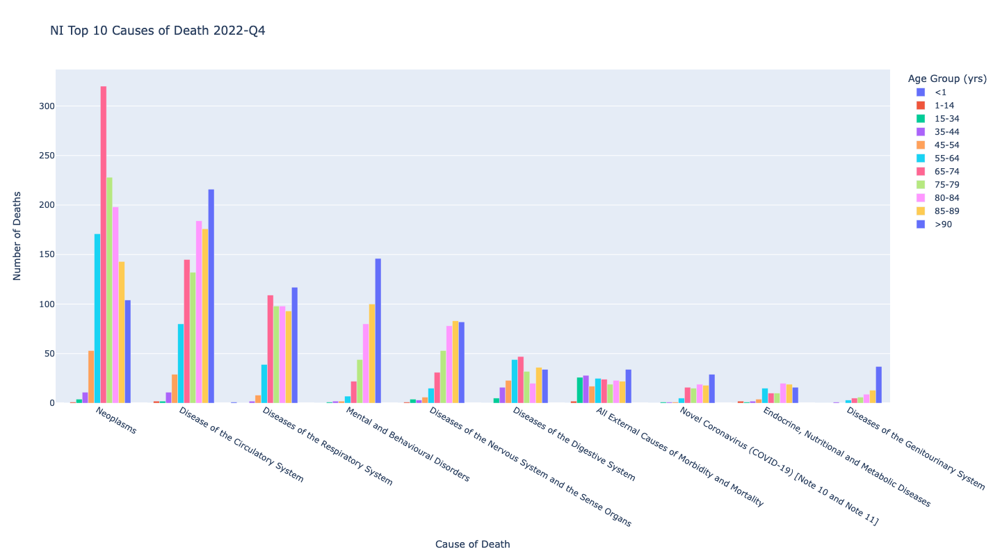

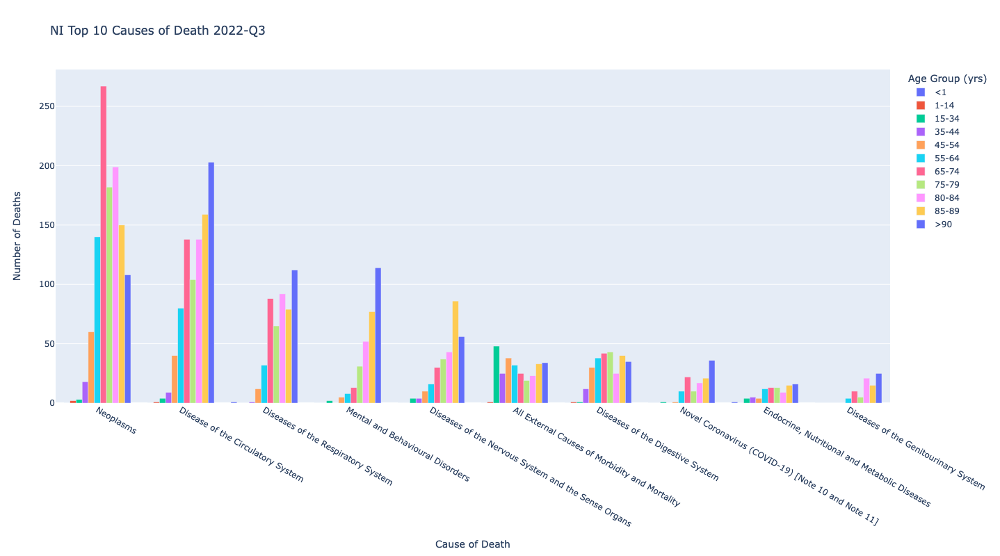

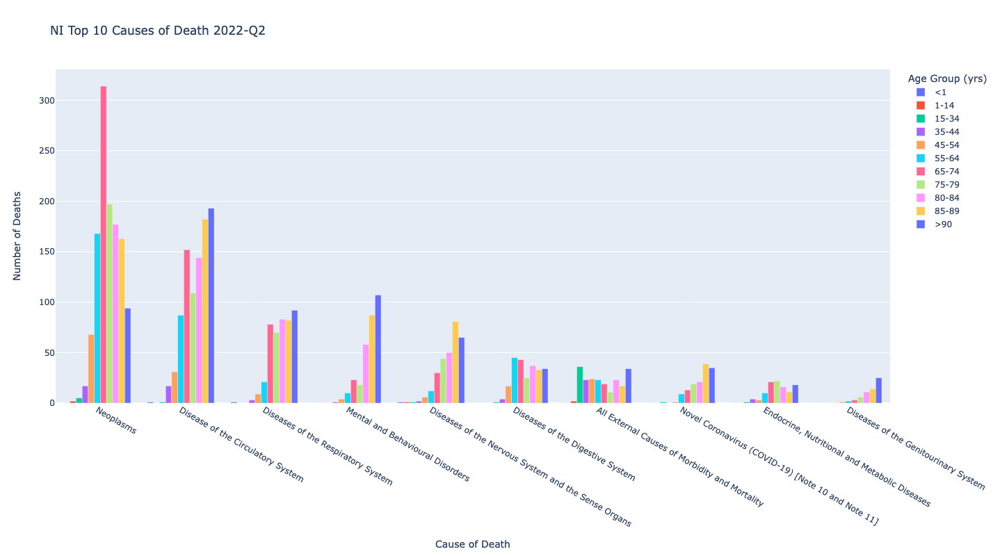

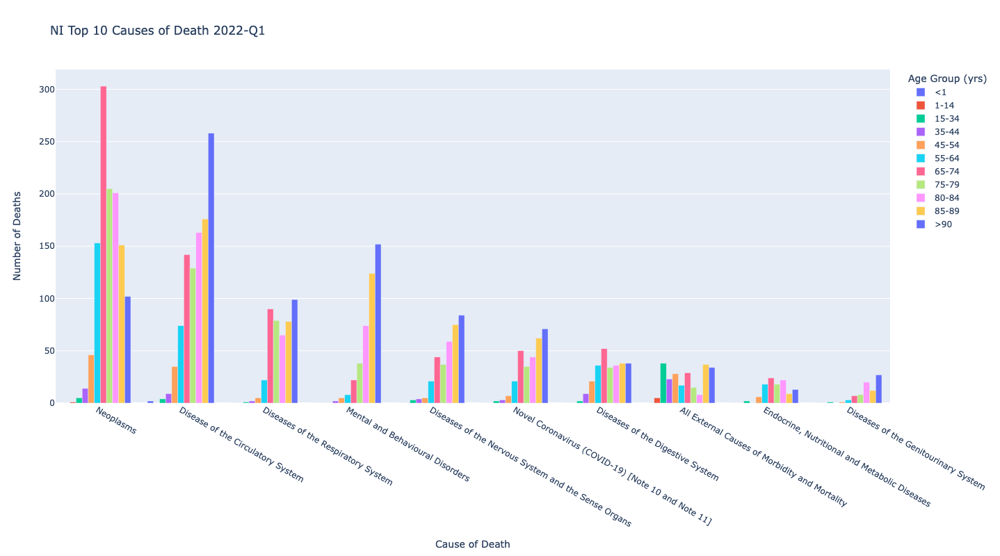

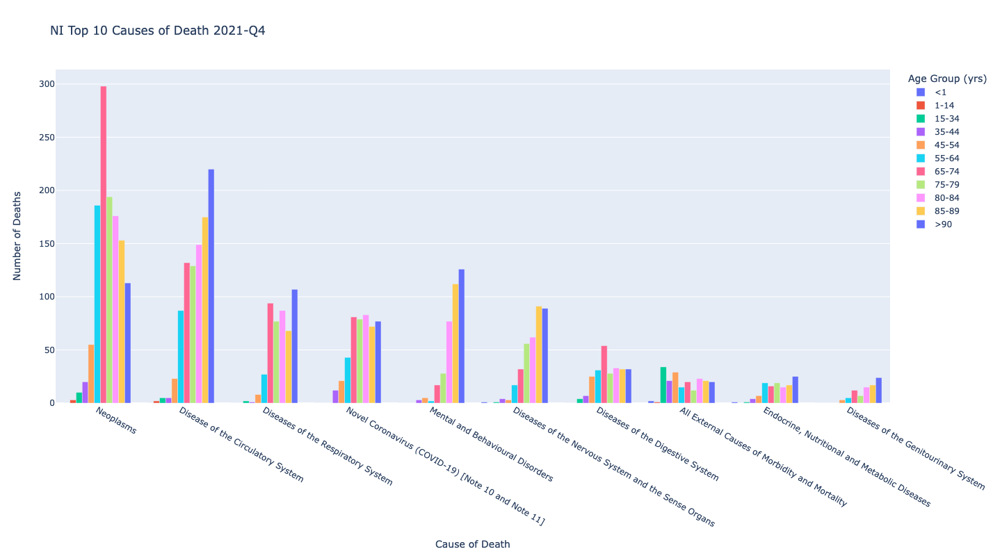

...

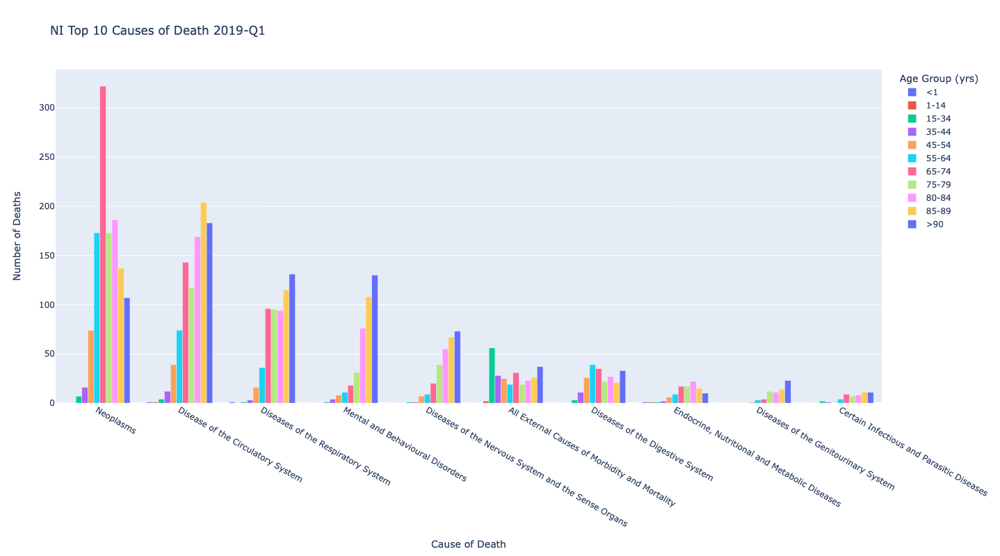

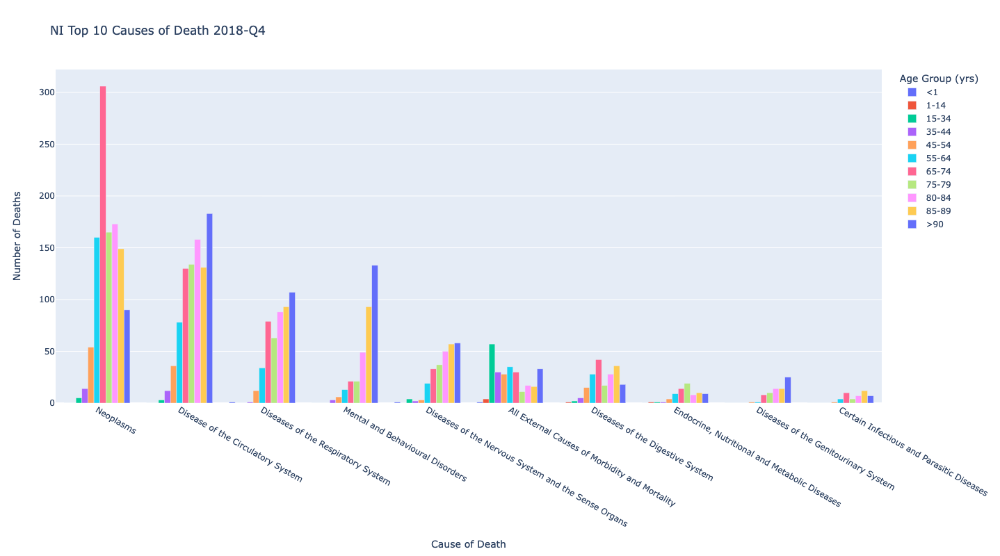

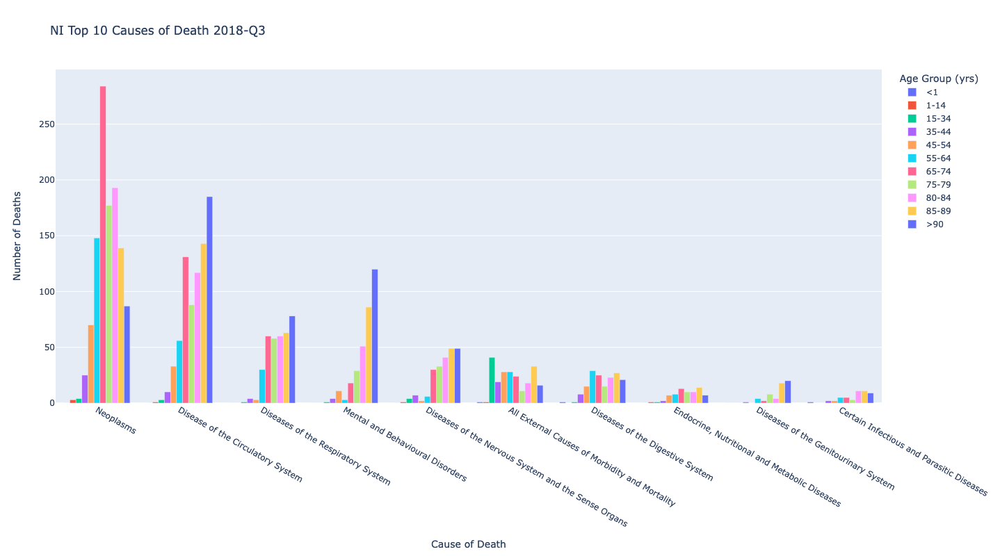

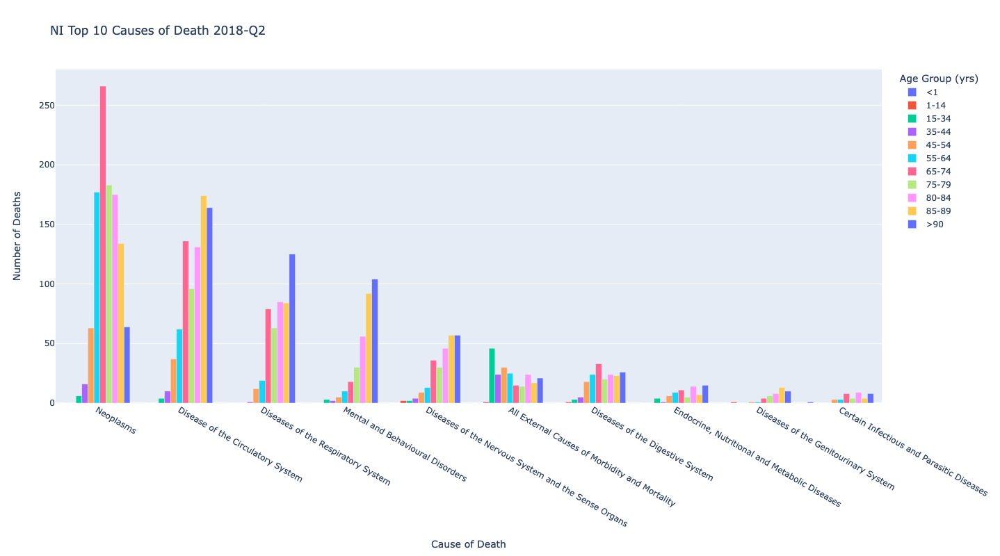

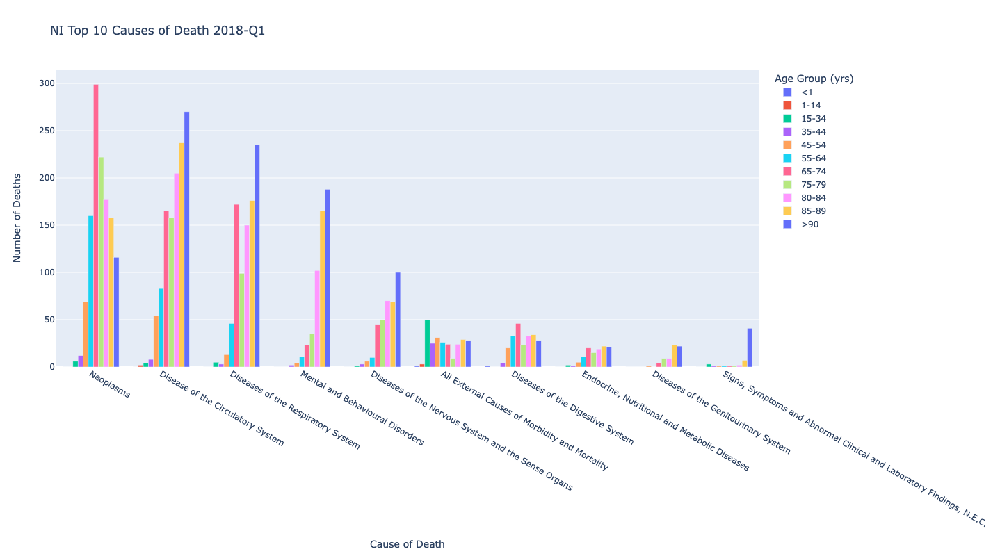

In [9]:
import plotly.express as px

for file_id, df in file_data_frames.items():

    # Let's exclude the Total of all codes (i.e. the first row in the table)
    this_count = df['ICD10_Code_Trimmed'].count()
    df_sans_total = df.iloc[1:this_count, :]
    
    df_sorted = df_sans_total.sort_values('Total', ascending=False)
    
    # Let's only focus on the top ten categories for death.
    df_sorted_top_10 = df_sorted.head(10)
    
    fig = px.bar(df_sorted_top_10, 
                 x='Cause_of_Death', 
                 y= ['<1', '1-14', '15-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80-84', '85-89', '>90'], #'Total',
                 title='NI Top 10 Causes of Death ' + file_id,
                 barmode='group',
                 height=800)

    # Set x-axis title
    fig.update_xaxes(title_text="Cause of Death")

    # Set y-axis titles
    fig.update_yaxes(title_text="Number of Deaths", secondary_y=False)

    # Set Legend Name
    fig.update_layout(legend_title_text='Age Group (yrs)')

    fig.show()
    
    fig.write_image('data/outbound/deaths/' + file_id + ".png")
    
    df_quarterly_deaths_summary.iloc[1:this_count, 2]

## Cause of Death as Percentage (2018-2022)
Let's download all of the files we have specified and load into dataframes for processing.

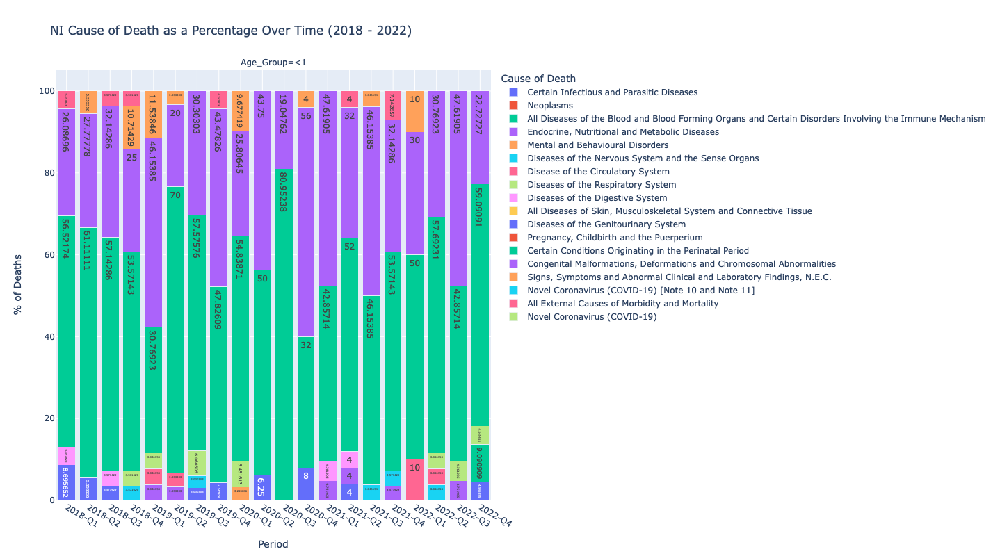

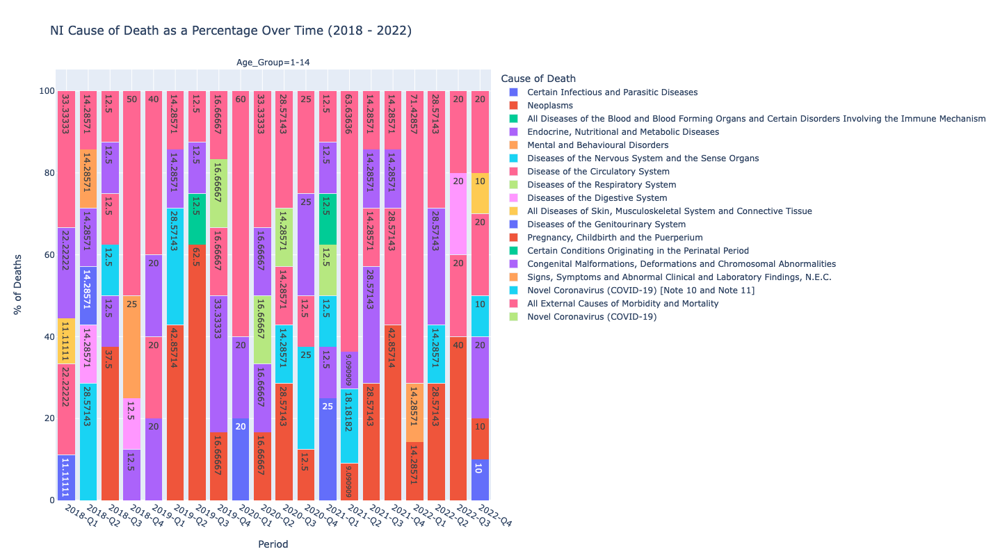

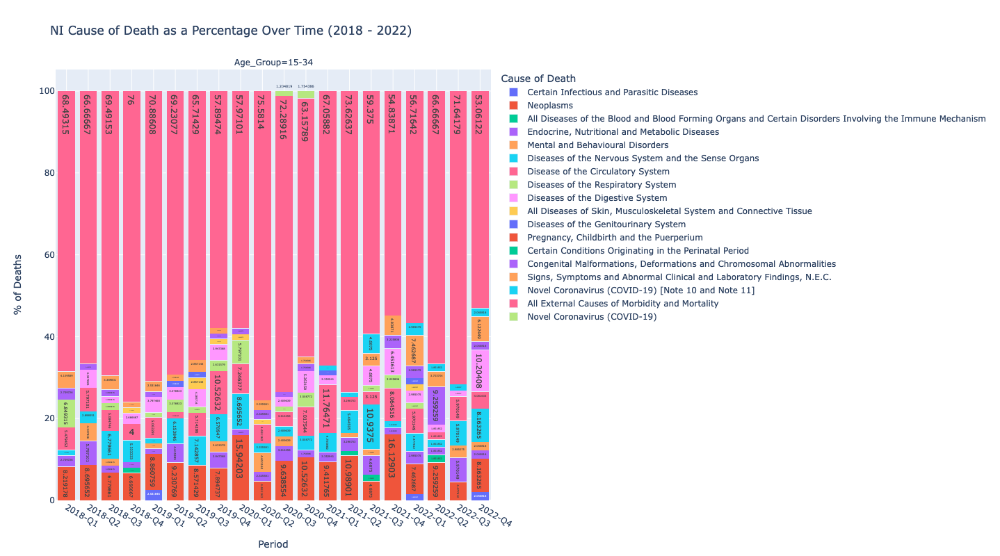

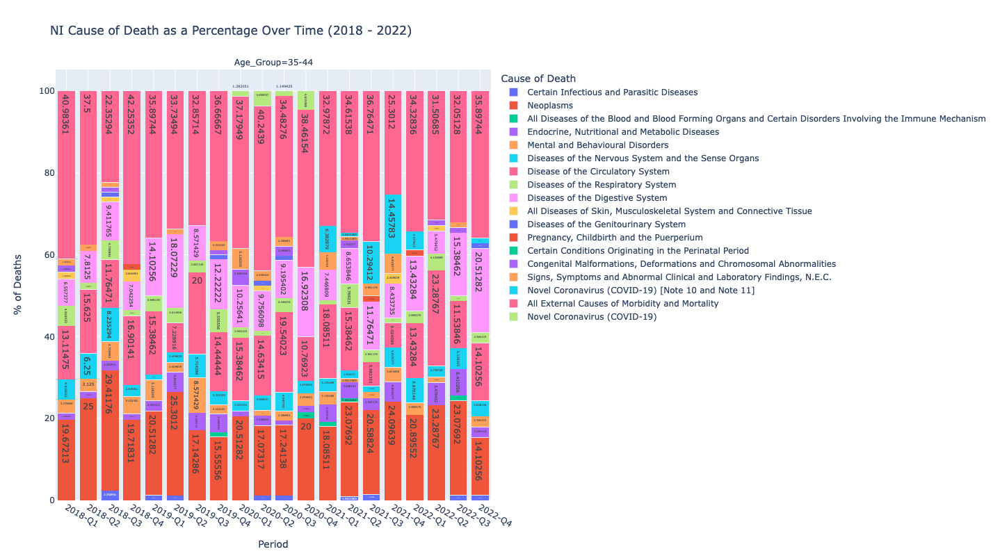

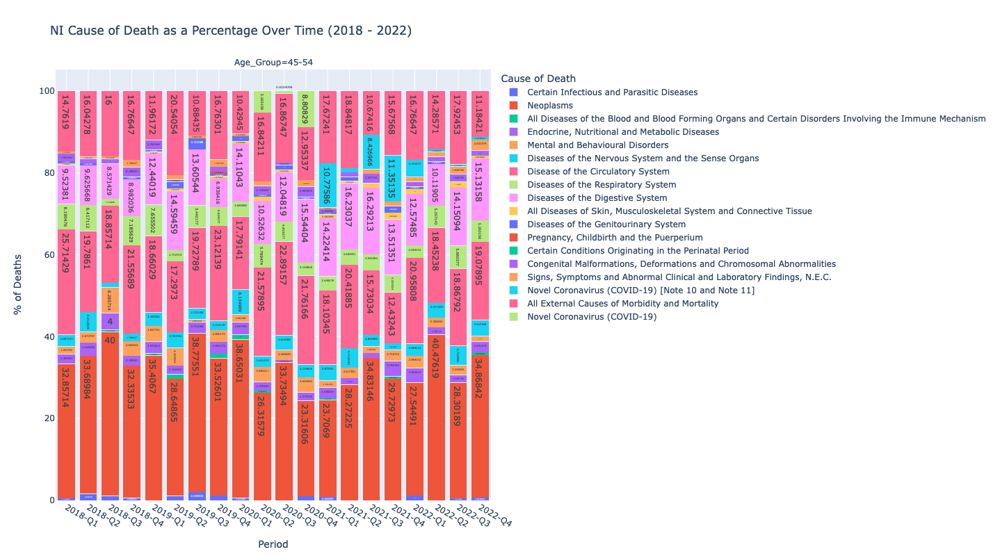

...

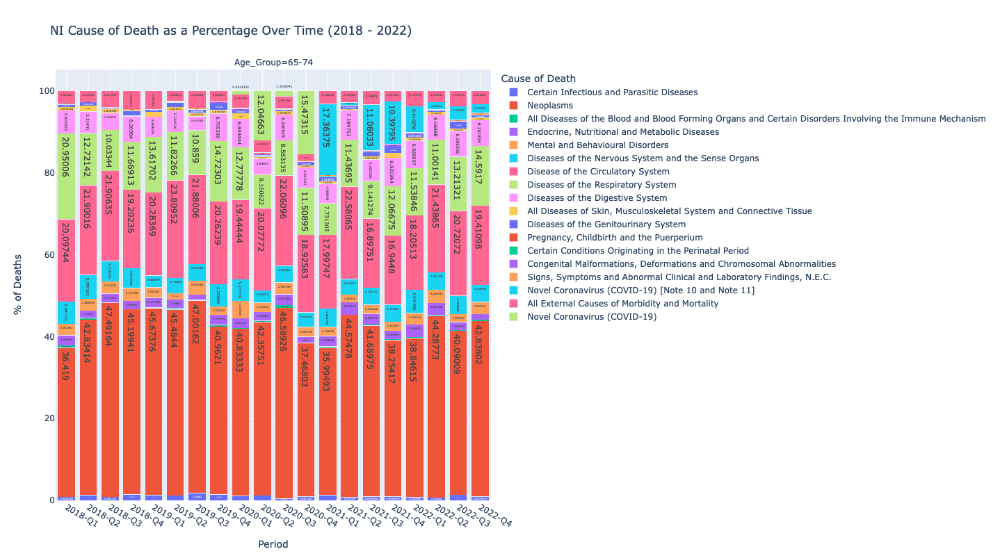

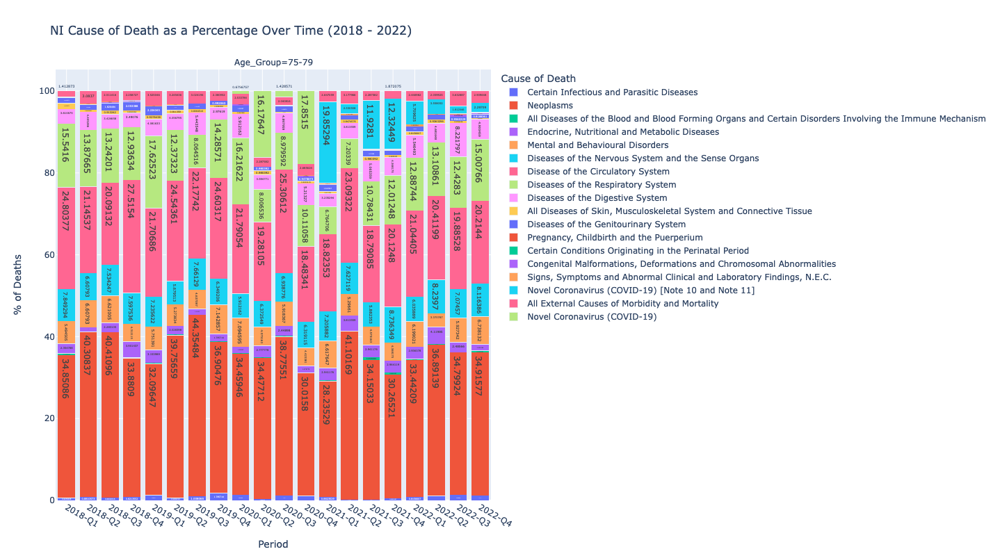

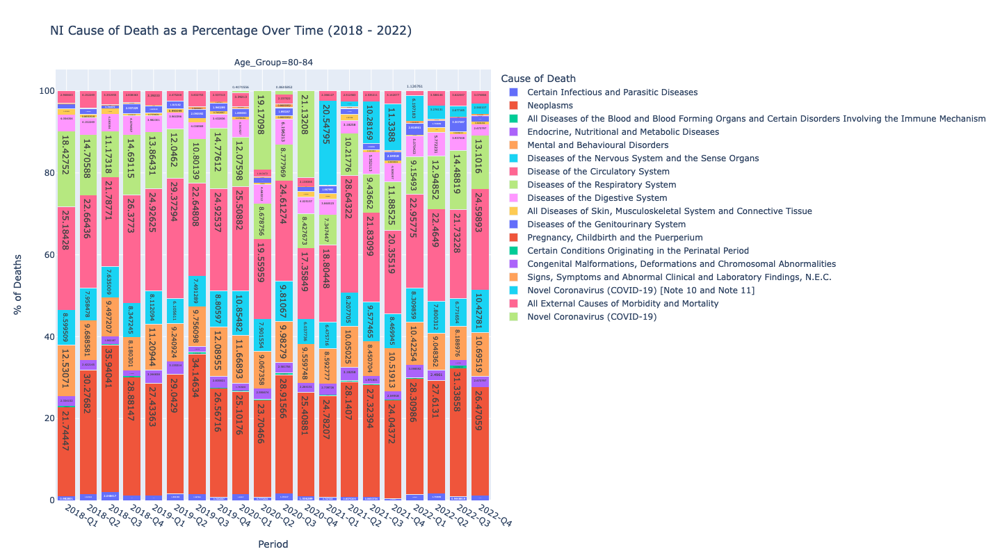

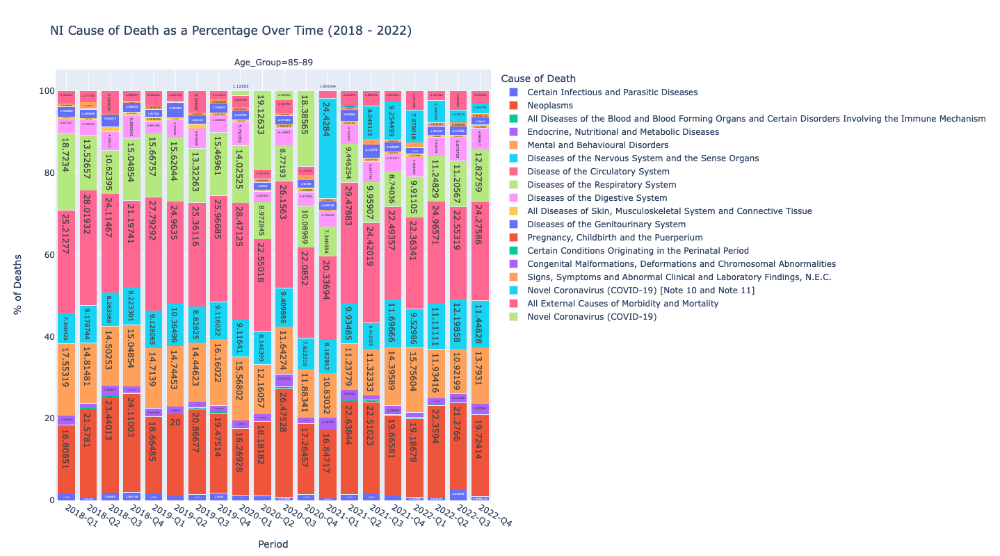

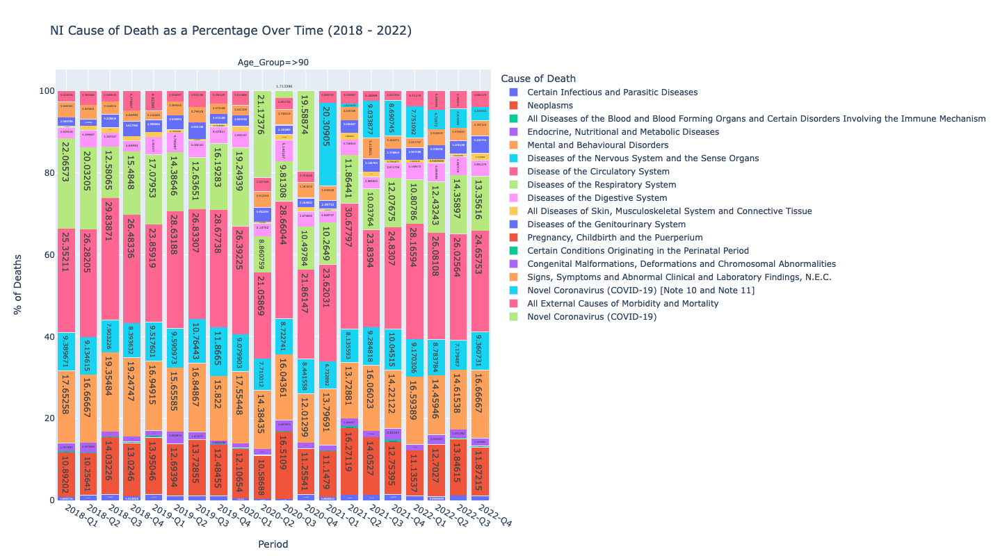

In [15]:
import plotly.express as px

age_groups = ['<1', '1-14', '15-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80-84', '85-89', '>90']
age_groups
#age_breadkown_df
for age_group in age_groups:
    
    df_subset = age_breadkown_df[age_breadkown_df['Age_Group'] == age_group]
    fig = px.bar(df_subset, 
                 x='Period', #['<1', '1-14', '15-34', '35-44', '45-54', '55-64', '65-74', '75-79', '80-84', '85-89', '90'], #'Period', 
                 y='Percentage_of_Period_Age_Deaths',
                 title='NI Cause of Death as a Percentage Over Time (2018 - 2022)',
                 barmode='stack',
                 facet_col='Age_Group',
                 facet_col_wrap=1,
                 color='Cause_of_Death',
                 text_auto=True,
                 category_orders={"Period": ['2018-Q1','2018-Q2','2018-Q3','2018-Q4','2019-Q1','2019-Q2',\
                                            '2019-Q3','2019-Q4', '2020-Q1', '2020-Q2', '2020-Q3', '2020-Q4', \
                                            '2021-Q1', '2021-Q2', '2021-Q3', '2021-Q4', '2022-Q1', '2022-Q2', \
                                            '2022-Q3','2022-Q4']},
                height=800)

    # Set x-axis title
    fig.update_xaxes(title_text="Period", showgrid=True)

    # Set y-axis titles
    fig.update_yaxes(title_text="% of Deaths", secondary_y=False)

    #fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')

    # Set Legend Name
    fig.update_layout(legend_title_text='Cause of Death')

    fig.show()
    
    #fig.write_image('data/outbound/deaths/' + age_group + ".pdf")